# GO enrichment

In [ ]:
import pandas as pd

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

import geneinfo as gi
gi.email('your@email.com')

In [ ]:
class left:
    def __rlshift__(self, df):
        "Left align columns of data frame: df << left()"
        left_aligned_df = df.style.set_properties(**{'text-align': 'left'})
        left_aligned_df = left_aligned_df.set_table_styles(
        [dict(selector = 'th', props=[('text-align', 'left')])])
        display(left_aligned_df)
        
df = pd.DataFrame(dict(name=['A', 'B'], desc=['bla bla bla bla', 'bla']))
df

## Global GO enrichment

**Enrichment against all GO terms with all protein coding genes as background:**

In [54]:
import importlib
import geneinfo
importlib.reload(geneinfo)

<module 'geneinfo' from '/Users/kmt/geneinfo/geneinfo/__init__.py'>

In [55]:
go_results = gi.go_enrichment(motor_genes_df.symbol)
go_results.head(10)

Could not map gene symbol "KIF28P" to ncbi id


,namespace,term_id,e/p,pval_uncorr,p_fdr_bh,ratio,bg_ratio,obj
0,CC,GO:0005874,e,3.174662e-104,5.793757e-101,0.296407,0.014664,<GO:0005874>
1,BP,GO:0007018,e,3.469444e-87,4.220231e-83,0.152695,0.002719,<GO:0007018>
2,CC,GO:0005871,e,1.323152e-82,1.207376e-79,0.134731,0.002185,<GO:0005871>
3,MF,GO:0008017,e,2.849730e-80,1.305176e-76,0.239521,0.012819,<GO:0008017>
4,CC,GO:0005813,e,1.960675e-77,1.192744e-74,0.314371,0.030444,<GO:0005813>
5,MF,GO:0019894,e,4.661206e-77,1.067416e-73,0.125749,0.002039,<GO:0019894>
6,CC,GO:0032391,e,3.269844e-75,1.491866e-72,0.122754,0.001991,<GO:0032391>
7,MF,GO:0003777,e,5.259928e-70,8.030157e-67,0.125749,0.002331,<GO:0003777>
8,MF,GO:0045505,e,7.657838e-68,8.768225e-65,0.110778,0.001797,<GO:0045505>
9,CC,GO:0016235,e,3.632820e-64,1.325979e-61,0.104790,0.001699,<GO:0016235>


**Show GO DAG for enrichment results:**

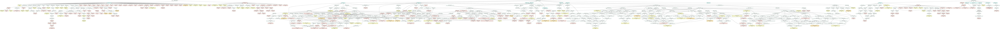

In [56]:
gi.show_go_dag_enrichment_results(go_results.obj)

**Same but only for top 10 GO terms:**

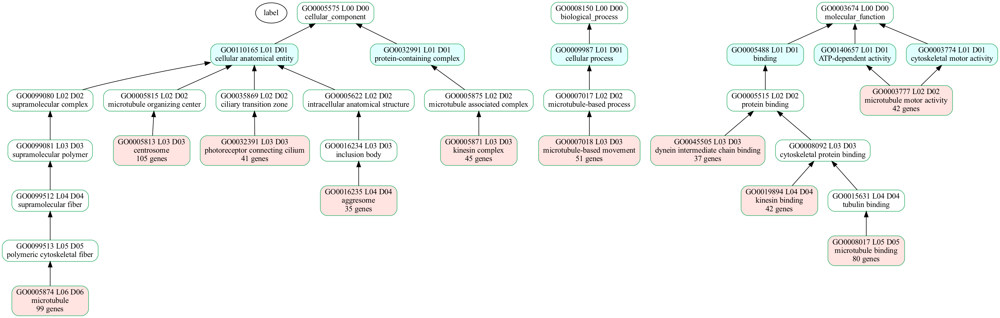

In [57]:
gi.show_go_dag_enrichment_results(go_results.obj[:10])

**Descriptions of the same 10 GO terms:**

In [58]:
gi.go_info(go_results.term_id[:10])

**<span style="color:gray;">GO:0005874:</span>** **microtubule**  
 Any of the long, generally straight, hollow tubes of internal diameter 12-15 nm and external diameter 24 nm found in a wide variety of eukaryotic cells; each consists (usually) of 13 protofilaments of polymeric tubulin, staggered in such a manner that the tubulin monomers are arranged in a helical pattern on the microtubular surface, and with the alpha/beta axes of the tubulin subunits parallel to the long axis of the tubule; exist in equilibrium with pool of tubulin monomers and can be rapidly assembled or disassembled in response to physiological stimuli; concerned with force generation, e.g. in the spindle.    

 ----

**<span style="color:gray;">GO:0007018:</span>** **microtubule-based movement**  
 A microtubule-based process that results in the movement of organelles, other microtubules, or other cellular components. Examples include motor-driven movement along microtubules and movement driven by polymerization or depolymerization of microtubules.    

 ----

**<span style="color:gray;">GO:0005871:</span>** **kinesin complex**  
 Any complex that includes a dimer of molecules from the kinesin superfamily, a group of related proteins that contain an extended region of predicted alpha-helical coiled coil in the main chain that likely produces dimerization. The native complexes of several kinesin family members have also been shown to contain additional peptides, often designated light chains as all of the noncatalytic subunits that are currently known are smaller than the chain that contains the motor unit. Kinesin complexes generally possess a force-generating enzymatic activity, or motor, which converts the free energy of the gamma phosphate bond of ATP into mechanical work.    

 ----

**<span style="color:gray;">GO:0008017:</span>** **microtubule binding**  
 Binding to a microtubule, a filament composed of tubulin monomers.    

 ----

**<span style="color:gray;">GO:0005813:</span>** **centrosome**  
 A structure comprised of a core structure (in most organisms, a pair of centrioles) and peripheral material from which a microtubule-based structure, such as a spindle apparatus, is organized. Centrosomes occur close to the nucleus during interphase in many eukaryotic cells, though in animal cells it changes continually during the cell-division cycle.    

 ----

**<span style="color:gray;">GO:0019894:</span>** **kinesin binding**  
 Interacting selectively and non-covalently and stoichiometrically with kinesin, a member of a superfamily of microtubule-based motor proteins that perform force-generating tasks such as organelle transport and chromosome segregation.    

 ----

**<span style="color:gray;">GO:0032391:</span>** **photoreceptor connecting cilium**  
 The portion of the photoreceptor cell cilium linking the photoreceptor inner and outer segments. It's considered to be equivalent to the ciliary transition zone.    

 ----

**<span style="color:gray;">GO:0003777:</span>** **microtubule motor activity**  
 A motor activity that generates movement along a microtubule, driven by ATP hydrolysis.    

 ----

**<span style="color:gray;">GO:0045505:</span>** **dynein intermediate chain binding**  
 Binding to an intermediate chain of the dynein complex.    

 ----

**<span style="color:gray;">GO:0016235:</span>** **aggresome**  
 An inclusion body formed by dynein-dependent retrograde transport of an aggregated protein on microtubules.    

 ----

**Show the GO DAG for a set of GO terms and their parent terms:**

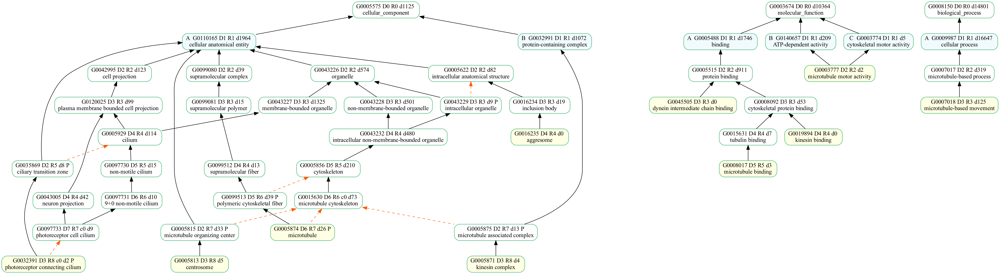

In [59]:
gi.show_go_dag_for_terms(go_results.term_id[:10])

**Specifying a custom set of background genes:**

The query genes should be a subset of the background genes:

In [60]:
all_protein_coding = set(pd.read_csv('geneinfo_cache/9606_protein_genes.txt', sep='\t').Symbol)
# only the first 50 genes:
subset_background = list(all_protein_coding)[:50] + motor_genes_df.symbol.tolist()

In [61]:
go_results = gi.go_enrichment(motor_genes_df.symbol, background_genes=subset_background)
go_results

Could not map gene symbol "KIF28P" to ncbi id
Could not map gene symbol "KIF28P" to ncbi id


,namespace,term_id,e/p,pval_uncorr,p_fdr_bh,ratio,bg_ratio,obj
0,CC,GO:0005813,e,8.279747e-07,0.000378,0.314371,0.276042,<GO:0005813>
1,CC,GO:0005874,e,2.975553e-06,0.000678,0.296407,0.260417,<GO:0005874>
2,CC,GO:0005737,e,2.878076e-05,0.004375,0.538922,0.497396,<GO:0005737>
3,MF,GO:0000981,p,9.358545e-05,0.018951,0.011976,0.028646,<GO:0000981>
4,MF,GO:0008017,e,6.502644e-05,0.018951,0.239521,0.210938,<GO:0008017>
5,CC,GO:0005929,e,3.614207e-04,0.032962,0.164671,0.143229,<GO:0005929>
6,CC,GO:0036064,e,3.598807e-04,0.032962,0.167665,0.145833,<GO:0036064>
7,CC,GO:0005930,e,6.152330e-04,0.046758,0.155689,0.135417,<GO:0005930>
8,CC,GO:0005829,e,7.499627e-04,0.048855,0.494012,0.460938,<GO:0005829>


**Use only the X chromosome as background:**

In [62]:
go_results = gi.go_enrichment(motor_genes_df.symbol, background_chrom='X')
go_results

Could not map gene symbol "KIF28P" to ncbi id


,namespace,term_id,e/p,pval_uncorr,p_fdr_bh,ratio,bg_ratio,obj
0,MF,GO:0045505,e,0.000041,0.010017,0.333333,0.002345,<GO:0045505>
1,MF,GO:0070840,e,0.000041,0.010017,0.333333,0.002345,<GO:0070840>
2,MF,GO:0008017,e,0.000031,0.010017,0.500000,0.012896,<GO:0008017>
3,CC,GO:0016235,e,0.000041,0.020475,0.333333,0.002345,<GO:0016235>


## Enrichment among a subset of GO terms

Extract terms matching regular expression:

geneinfo_cache/go-basic.obo: fmt(1.2) rel(2024-09-08) 44,296 Terms; optional_attrs(comment def relationship synonym xref)


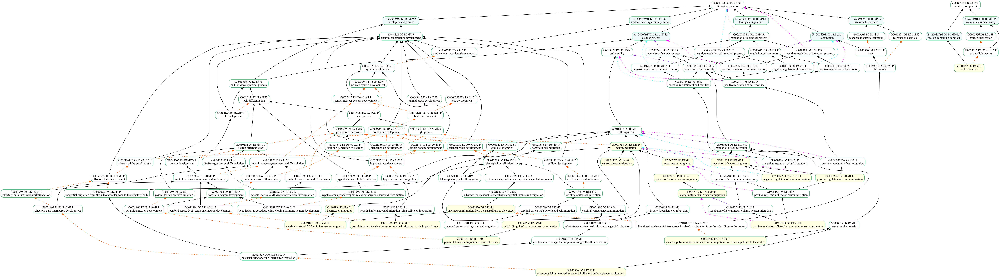

In [63]:
#target_terms = gi.get_terms_for_go_regex('brain')
#target_terms = gi.get_terms_for_go_regex('microtubul')
# target_terms = gi.get_terms_for_go_regex('spindle')
target_terms = gi.get_terms_for_go_regex(r'neuron\S* migration')
gi.show_go_dag_for_terms(target_terms)

In [64]:
go_results = gi.go_enrichment(motor_genes_df.symbol, terms=target_terms, list_study_genes=True)
go_results.head()

geneinfo_cache/go-basic.obo: fmt(1.2) rel(2024-09-08) 44,296 Terms; optional_attrs(def relationship)


Could not map gene symbol "KIF28P" to ncbi id


,namespace,term_id,e/p,pval_uncorr,p_fdr_bh,ratio,bg_ratio,obj,study_genes
0,CC,GO:0005615,p,0.000016,0.000063,0.020958,0.076426,<GO:0005615>,"[ACTB, BLOC1S1, HSPA1A, SNCA, LRP8, DYNC2I1, T..."
1,CC,GO:0032991,e,0.000155,0.000310,0.071856,0.031027,<GO:0032991>,"[ACTB, HTT, HNRNPU, HSPA1A, HSPA1B, HSP90AB1, ..."
2,BP,GO:0140650,e,0.000778,0.031519,0.005988,0.000146,<GO:0140650>,"[PAFAH1B1, NDEL1]"
3,BP,GO:0001764,e,0.000515,0.031519,0.023952,0.005487,<GO:0001764>,"[BBS4, PAFAH1B1, PCM1, PSEN1, DISC1, DCDC2, ND..."


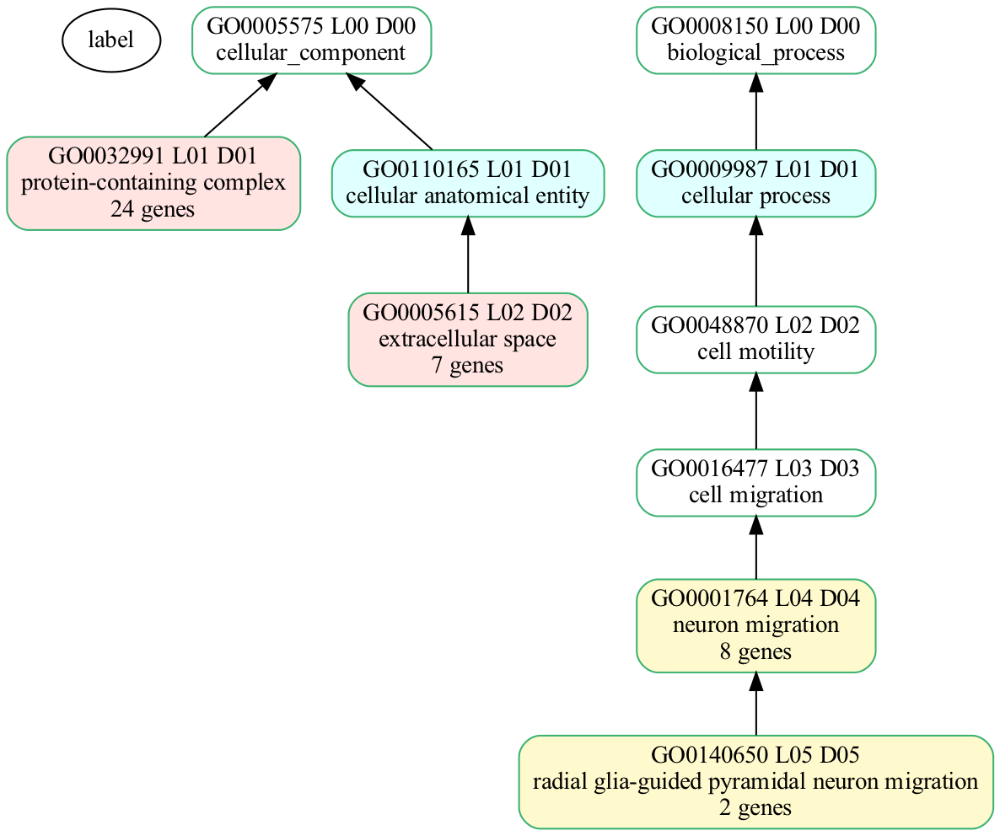

In [65]:
gi.show_go_dag_enrichment_results(go_results.obj)

Extract terms matching two regular expressions in any order:

geneinfo_cache/go-basic.obo: fmt(1.2) rel(2024-09-08) 44,296 Terms; optional_attrs(comment def relationship synonym xref)


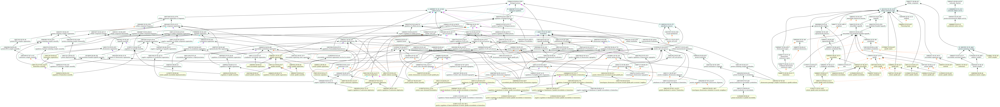

In [66]:
pattern_one = r'microtub\S*'
pattern_two = r'spindle'
regex = fr"(?=.*({pattern_one}))(?=.*({pattern_two}))(?=.*)"

target_terms = gi.get_terms_for_go_regex(regex)
gi.show_go_dag_for_terms(target_terms)

In [67]:
go_results = gi.go_enrichment(motor_genes_df.symbol, terms=target_terms, list_study_genes=True)
go_results.head()

geneinfo_cache/go-basic.obo: fmt(1.2) rel(2024-09-08) 44,296 Terms; optional_attrs(def relationship)


Could not map gene symbol "KIF28P" to ncbi id


,namespace,term_id,e/p,pval_uncorr,p_fdr_bh,ratio,bg_ratio,obj,study_genes
0,CC,GO:0005874,e,3.174662e-104,1.428598e-102,0.296407,0.014664,<GO:0005874>,"[APC, KIF1A, CENPE, DCTN1, DNAH5, DNAH6, DNAH8..."
1,BP,GO:0007018,e,3.469444e-87,3.816388e-85,0.152695,0.002719,<GO:0007018>,"[CENPE, DYNC1I2, DYNC1LI2, KIF2A, KIF3C, KIF5A..."
2,CC,GO:0005813,e,1.960675e-77,4.411518e-76,0.314371,0.030444,<GO:0005813>,"[APC, ARL3, BBS4, BICD1, CENPF, CETN1, CETN2, ..."
3,CC,GO:0005868,e,3.150407e-42,4.725610e-41,0.068862,0.001117,<GO:0005868>,"[DYNC1H1, DYNC1I1, DYNC1I2, DYNC1LI2, DYNLT3, ..."
4,CC,GO:0030286,e,5.844463e-35,6.575021e-34,0.056886,0.000923,<GO:0030286>,"[DCTN1, DNAH6, DNAH9, DYNC1H1, DYNC1I2, DYNC1L..."


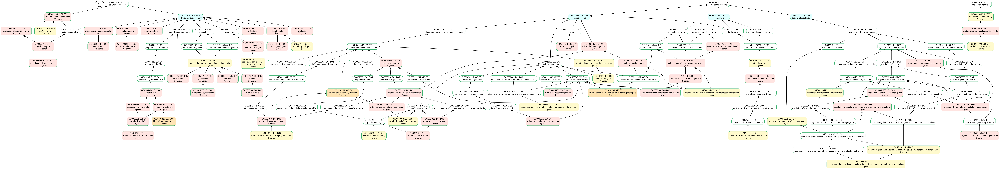

In [68]:
gi.show_go_dag_enrichment_results(go_results.obj)